# Исследование рынка общественного питания

# *Задача*

Для инвесторов из фонда «Shut Up and Take My Money» подготовить исследование рынка Москвы в области заведений общественного питания, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

# *Данные*

В нашем распоряжении датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

Описание данных:

Файл moscow_places.csv:
 * name — название заведения;
 * address — адрес заведения;
 * category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 * hours — информация о днях и часах работы;
 * lat — широта географической точки, в которой находится заведение;
 * lng — долгота географической точки, в которой находится заведение;
 * rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
 * price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 * avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    «Средний счёт: 1000–1500 ₽»;
    «Цена чашки капучино: 130–220 ₽»;
    «Цена бокала пива: 400–600 ₽».
      и так далее;
 * middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

 * middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
 * chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
     0 — заведение не является сетевым
     1 — заведение является сетевым
 * district — административный район, в котором находится заведение, например Центральный административный округ;
 * seats — количество посадочных мест.


# *Ход работы*

Часть 1.  Откройте файл с данными и изучите общую информацию.

Часть 2. Предобработка данных

      2.1 Поиск и обработка дубликатов и пропусков;

      2.2 Сoздание столбцов 'street', 'is_24/7';

Часть 3. Анализ данных

      3.1 Изучение  категорий заведений представленых в данных;

      3.2 Исследование количества посадочных мест в местах по категориям;

      3.3 Соотношение сетевых и несетевых заведений;
 
      3.4 Какие категории заведений чаще являются сетевыми?

      3.5 Найдите топ-15 популярных сетей в Москве.

      3.6 Изучение административных районов Москвы присутвующих в датасете.
      
      3.7 Визуализация распределения средних рейтингов по категориям заведений.
      
      3.8 Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
      
      3.9 Определим топ-15 улиц по количеству заведений.
      
      3.10 Определить улицы, на которых находится только один объект общепита.
      
      3.11 Анализ среднего чека по районам.
      
      3.12 Вывод

Часть 4. Детализация исследования: открытие кофейни.



In [1]:
# импортируем библиотеки

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import plotly.express as px
import warnings; warnings.filterwarnings(action='ignore')
from plotly import graph_objects as go
from IPython.display import set_matplotlib_formats

from scipy import stats as st

# убираем предупреждения
pd.set_option('chained_assignment', None)  


# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# снимаем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

# игнорируем предупреждения
pd.set_option('chained_assignment', None)

## Часть.  Откроем файл с данными и изучим общую информацию.

In [2]:
# откроем файл с данными, сохраним в переменной moscow_places.
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


## Часть.  Предобработка данных.

### Поиск и обработка дубликатов и попусков;

In [5]:
# проверка на дубликаты
df.duplicated().sum()

0

Явных дубликатов не выявленно. Чтобы проверить на неявные дубликаты, приведем названия заведений к одному регистру.

In [6]:
# приведем все названия к нижнему регистру.
df['name'] = df['name'].str.lower()

In [7]:
# ищим неявные дубликаты в названиях заведений
dhh = df.groupby('name').agg({'name': 'count'})
dhh.columns = ['total']
dhh.sort_values(by='total', ascending=False).head(60)

,total
name,
кафе,189
шоколадница,120
домино'с пицца,77
додо пицца,74
one price coffee,72
яндекс лавка,69
cofix,65
prime,50
хинкальная,44


Неявных дублтикатов также не обнаружено.

In [8]:
# проверим наличие задублированных заведений по месту их нахождени.
df[df.duplicated(['name', 'lat', 'lng'])]


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


In [9]:
# сколько ресторанов с таким названием
df.loc[df['name'] == 'more poke']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
6088,more poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN


Всего один дубликат. На дельнейший анализ это никак не повлият , оставим этот ресторан на месте.

In [10]:
# посмотрим - сколько пропущенных значений в каждой колонке.
df.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [11]:
# исследуем пропуски в колонке price 
price_nan = df[df['price'].isna()]
price_nan['price'].isna().sum()

5091

Посмотрим как пропуски в строке price могут быть связаны с пропусками в столбцах: avg_bill, middle_avg_bill, middle_coffee_cup.

In [12]:
price_nan['avg_bill'].isna().sum()

4348

In [13]:
price_nan['middle_avg_bill'].isna().sum()

4621

In [14]:
price_nan['middle_coffee_cup'].isna().sum()

4834

Отсуствие информации о категории цен почти всегда влечет за собой также отсутствие информации по таким показателям как средняя стоимость заказа(avg_bill), число с оценкой среднего чека( middle_avg_bill), 
число с оценкой одной чашки капучино(middle_coffee_cup).

Данные пропуски ничем не будем заполнять, чтобы не исказить результаты исследования.
Вставим в место пропусков значение unknown

In [15]:
df.fillna('unknown').head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,unknown,unknown,unknown,unknown,0,unknown
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,unknown,0,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,unknown,0,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,unknown,Цена чашки капучино:155–185 ₽,unknown,170.0,0,unknown
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,unknown,1,148.0


### Сoздание столбцов 'street', 'is_24/7';

In [16]:
# создадим столбец 'street':
df['street'] = df['address'].str.split(',').str[1].str.strip()


In [17]:
# создадим столбец 'is_24/7':
df['is_24/7'] = df['hours'].fillna('').str.contains('ежедневно', 'круглосуточно')


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  street             8406 non-null   object 
 15  is_24/7            8406 non-null   bool   
dtypes: bool(1), float64(6), 

## Шаг. Анализ данных

### Изучение  категории заведений представлены в данных.

Исследуйте количество объектов общественного питания по категориям: 

In [19]:
df_category = (df.groupby('category')
               .agg(count=('name','count'))
               .reset_index()
              .sort_values('count', ascending=False))
df_category

,category,count
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [20]:
# определим процент каждой категории от общего числа заведений
df_category['precent'] = ((df_category['count'] / df_category['count'].sum()) *100).round(1)

df_category

,category,count,precent
3,кафе,2378,28.3
6,ресторан,2043,24.3
4,кофейня,1413,16.8
0,"бар,паб",765,9.1
5,пиццерия,633,7.5
2,быстрое питание,603,7.2
7,столовая,315,3.7
1,булочная,256,3.0


In [21]:
# построим столбчатый график  распределения категорий
plt.figure(figsize=(10, 4))
fig = px.bar(df_category, x='category', y='precent', title='Распределение категорий объектов обественного питания')
fig.update_xaxes(title_text='Категории') # подпись для оси X
fig.update_yaxes(title_text='Процент')
fig.show() 

<Figure size 720x288 with 0 Axes>

Больше всего заведений в категории кафе и рестораны. Меньше всего представителей из категории столовая и булочная.

### Исследование количества посадочных мест в заведениях по категориям.

In [22]:
# сделаем группировку по категориям и посчитаем среднее количество посадочных мест в каждой категории
df_seat = (df.groupby('category')
           .agg(mean=('seats','median'))
               .reset_index()
              .sort_values('mean', ascending=False))
df_seat

,category,mean
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


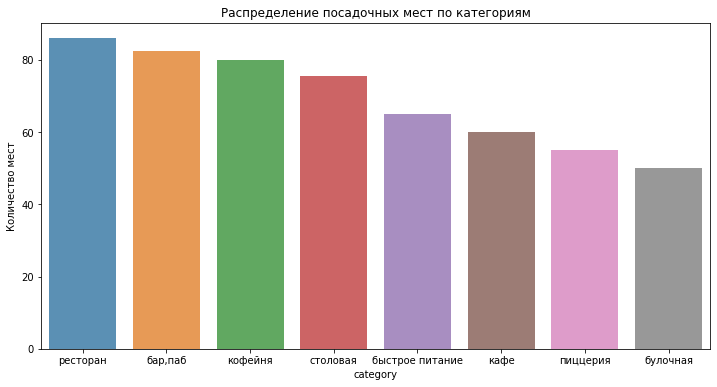

In [23]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='mean', data=df_seat, alpha=0.8)
ax.set_title('Распределение посадочных мест по категориям')
ax.set_ylabel('Количество мест')
plt.show()

Бары и рестораны несомненные лидеры по количеству посадочных мест. Это вызванно тем чтов заведение быстрого питания, столовую или кафе, посетители обычно заходят быстро перекусить и пойти дальше по своим делам. И за день при небольшом количестве посадочных мест может пройти много людей, тогда как в бары и рестораны приходят чтобы провести там досуг и места занимают на продолжительное время, поэтому если бар хочет хорошую выручку, соотвественно нужно больше посадочных мес. А в пиццериях и булочных чаще вооще берут на вынос.

### Соотношение сетевых и несетевых заведений.

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [24]:
df_chain = (df.groupby('chain')
            .agg(count=('name','count'))
            .reset_index())
df_chain['precent'] = ((df_chain['count'] / df_chain['count'].sum()) *100).round(1)
df_chain

,chain,count,precent
0,0,5201,61.9
1,1,3205,38.1


In [25]:
fig = go.Figure(data=[go.Pie(labels=df_chain['chain'], # указываем значения, которые появятся на метках сегментов
                             values=df_chain['precent'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Cоотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])
fig.show() # выводим график

Почти 62% всех заведений не сетевые.

### Какие категории заведений чаще являются сетевыми?

In [26]:
df_chain_category = (df.groupby('category')
                     .agg({'chain' : 'sum', 'name' : 'count'})
                     .reset_index())
df_chain_category.columns = ['category', 'chain', 'total']
# Добавим столбец процентного соотношения
df_chain_category['precent'] = ((df_chain_category['chain'] / df_chain_category['total']) *100).round(1)

df_chain_category = df_chain_category.sort_values(by='precent', ascending=False)
df_chain_category

,category,chain,total,precent
1,булочная,157,256,61.3
5,пиццерия,330,633,52.1
4,кофейня,720,1413,51.0
2,быстрое питание,232,603,38.5
6,ресторан,730,2043,35.7
3,кафе,779,2378,32.8
7,столовая,88,315,27.9
0,"бар,паб",169,765,22.1


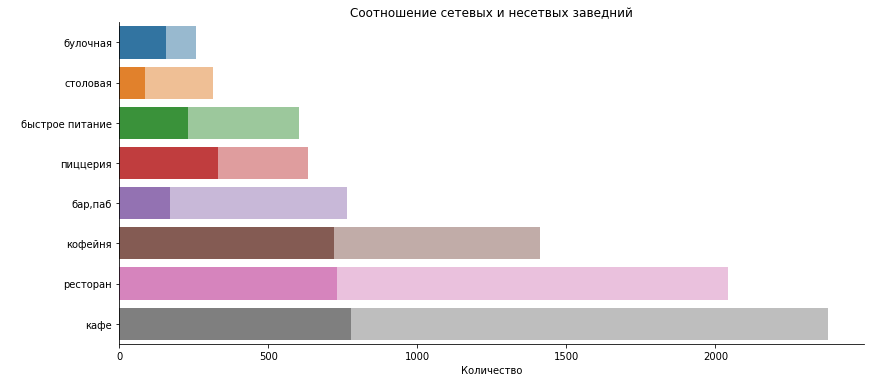

In [27]:
ax = sns.catplot(data=df_chain_category.sort_values('total'), 
                 kind='bar', 
                 x='chain', 
                 y='category',               
                 alpha=1, 
                 aspect=12/5,
                orient='h')
ax1 = sns.barplot(x='total', y='category', data=df_chain_category.sort_values('total'), alpha=0.5)
ax.set_axis_labels('Количество', ' ')
plt.title('Соотношение сетевых и несетвых заведний')
plt.show()

Чаще всего сетевыми являются булочные, пиццерии, кофейни. Совсем редко сетевые бывают столовые и бары.

### Найдите топ-15 популярных сетей в Москве.

In [28]:
# сделаем срез по сетевым заведения и найдем 15 самых популярных
top_15 = (df.query('chain == 1').groupby('name')
          .agg(count=('name','count'))
          .reset_index()
          .sort_values(by='count', ascending=False))
top_15 = top_15[:15]
top_15

,name,count
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


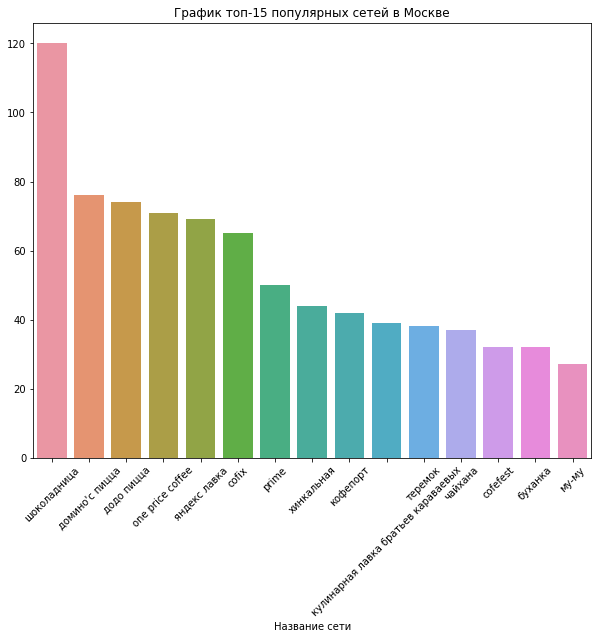

In [29]:
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='name', y='count', data=top_15)
ax.set_title('График топ-15 популярных сетей в Москве')
ax.set_xlabel('Название сети')
plt.xticks(rotation=45)
ax.set_ylabel('') 
plt.show()

In [30]:
# к каким категориям относятся самые популярные сети
top_15_category = (top_15.merge(df, on='name', how='left')
                   .groupby(['category', 'name'])
                   .agg(count=('name','count'))
                   .reset_index()
                   .sort_values(by='count', ascending=False))

top_15_category = top_15_category[:15].groupby('category')['count'].sum().reset_index().sort_values(by='count', ascending=False)
top_15_category

,category,count
2,кофейня,329
4,ресторан,169
3,пиццерия,151
1,кафе,84
0,булочная,25


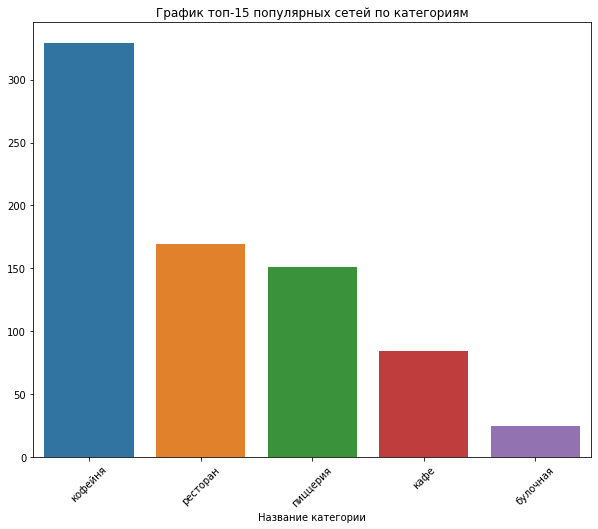

In [31]:
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='category', y='count', data=top_15_category)
ax.set_title('График топ-15 популярных сетей по категориям')
ax.set_xlabel('Название категории')
plt.xticks(rotation=45)
ax.set_ylabel('') 
plt.show()

Самыми популярными оказались сетевые заведнеия  из категории кофейня, ресторан, пиццерия.

### Изучение административных районов Москвы присутвующих в датасете.

Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [32]:
df_distr_catrgor  = df.groupby(['district', 'category'], as_index = False)[['name']].count()
df_distr_catrgor

,district,category,name
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


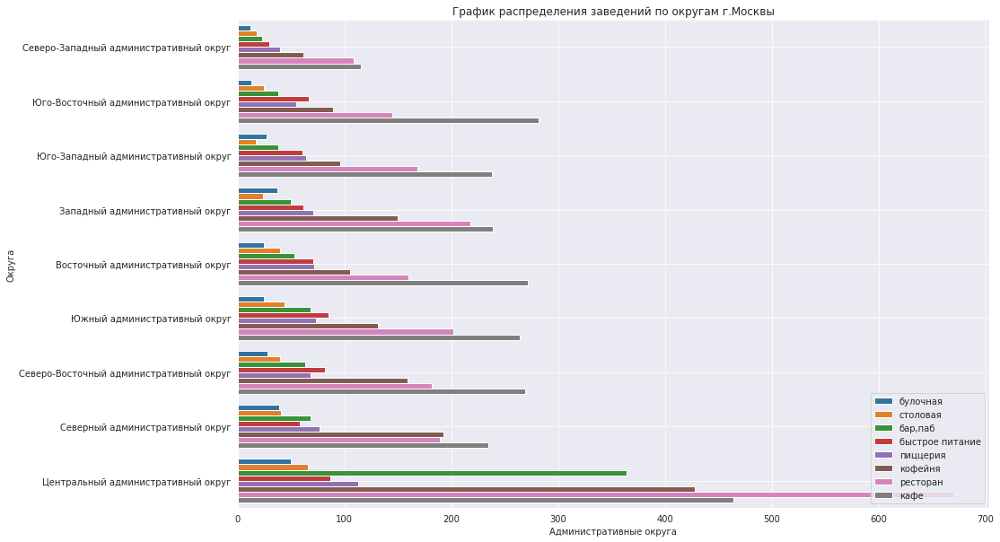

In [33]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(15, 10))
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='district', data=df_distr_catrgor.sort_values('name'), hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения заведений по округам г.Москвы')
plt.xlabel('Административные округа')
plt.ylabel('Округа')
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

### Визуализация распределение средних рейтингов по категориям заведений

In [34]:
df_rating = df.groupby('category', as_index = False)['rating'].mean()
df_rating

,category,rating
0,"бар,паб",4.387712
1,булочная,4.268359
2,быстрое питание,4.050249
3,кафе,4.123886
4,кофейня,4.277282
5,пиццерия,4.301264
6,ресторан,4.290357
7,столовая,4.211429


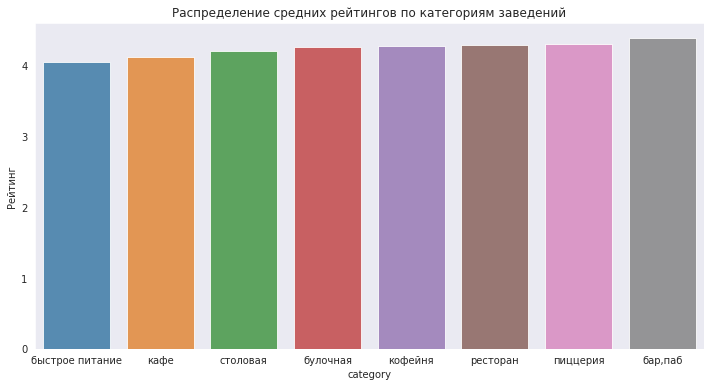

In [35]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='category', y='rating', data=df_rating.sort_values('rating'), alpha=0.8)
ax.set_title('Распределение средних рейтингов по категориям заведений')
ax.set_ylabel('Рейтинг')
plt.show()

Средний рейтинг в разных категориях заведений почти не отличается.

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [36]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [37]:
# для каждого округа посчитаем медианный рейтинг 
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


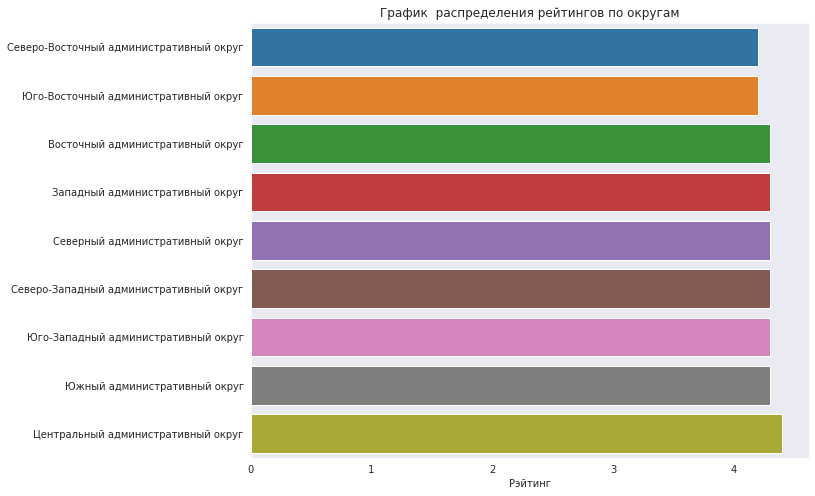

In [38]:
# построим столбчатый график  распределения рейтингов
plt.figure(figsize=(10, 8))
ax = sns.barplot(x='rating', y='district', data=rating_df.sort_values('rating'), orient='h')
ax.set_title('График  распределения рейтингов по округам')
ax.set_xlabel('Рэйтинг') 
ax.set_ylabel('') 
plt.show()

In [39]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [40]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

In [41]:
# Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m


### Определим топ-15 улиц по количеству заведений.

In [42]:
# Сгруппируем данные по колонке street
df_street = df.groupby('street').agg(count=('name','count')).sort_values('count', ascending=False).reset_index()
street_top15 = df_street[:15]
street_top15



,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


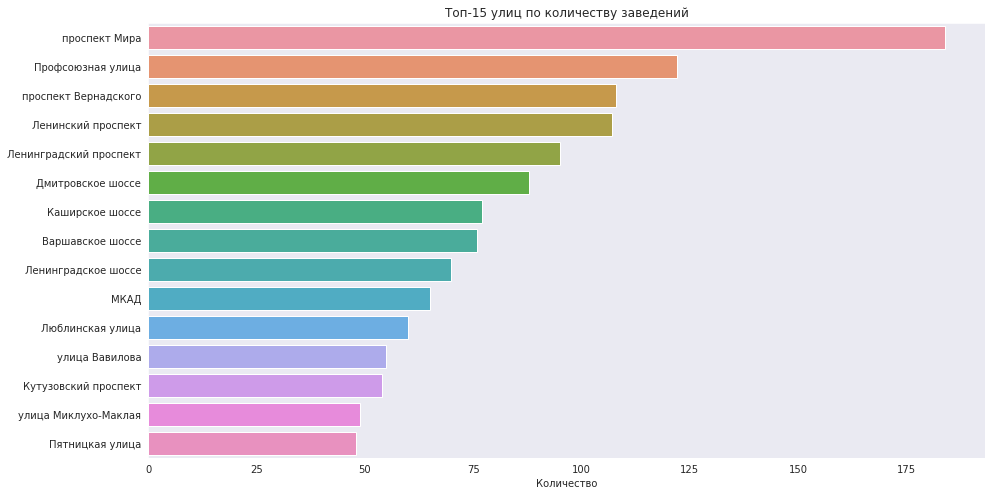

In [43]:
plt.figure(figsize=(15, 8))
ax = sns.barplot(x='count', y='street', data=street_top15, orient='h')
ax.set_title('Топ-15 улиц по количеству заведений')
ax.set_xlabel('Количество') 
ax.set_ylabel('') 
plt.show()

Лидирующие улица по количеству заведений :
 1. Проспект Мира,
 2. Профсоюзная улица,
 3. Проспект Вернадского и Ленинский проспект
 
В самом низу рейтинга из топ 15 оказалась Пятницкая улица. Но скорее это связано с тем что это очень маленькая улица.


### Определить улицы, на которых находится только один объект общепита.

Чтобы провести анализ улиц на которых находится только один объект общепита. Сгруппируем данные по району и по улицам. Сразу посчитаем в каких районах находится больше всего таких улиц.

In [44]:
df_distr_street  = df.groupby(['district', 'street'], as_index = False)[['name']].count()
df_distr_street = df_distr_street.query('name == 1').groupby('district')['street'].count().reset_index()
df_distr_street

,district,street
0,Восточный административный округ,52
1,Западный административный округ,36
2,Северный административный округ,53
3,Северо-Восточный административный округ,56
4,Северо-Западный административный округ,21
5,Центральный административный округ,148
6,Юго-Восточный административный округ,42
7,Юго-Западный административный округ,18
8,Южный административный округ,50


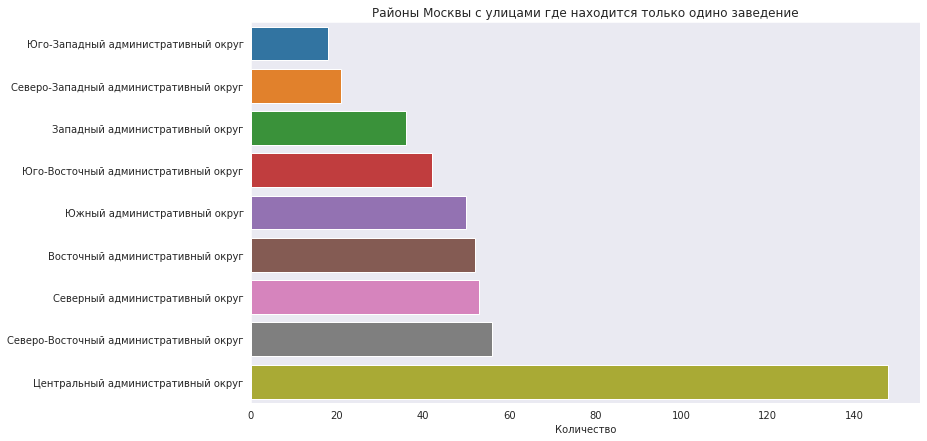

In [45]:
plt.figure(figsize=(12, 7))
ax = sns.barplot(x='street', y='district', data=df_distr_street.sort_values('street'))
ax.set_title('Районы Москвы с улицами где находится только одино заведение')
ax.set_xlabel('Количество') 
ax.set_ylabel('') 
plt.show()

Центральный район несомненный лидер данного рейтинга.

###  Анализ среднего чека по районам.

Посчитаем медиану   средних чеков заведений для каждого района. Используем это значение в качестве ценового индикатора района и построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [46]:
df_avg_chek = df.groupby('district')['middle_avg_bill'].mean().reset_index()
df_avg_chek

,district,middle_avg_bill
0,Восточный административный округ,820.626923
1,Западный административный округ,1053.225490
2,Северный административный округ,927.959627
3,Северо-Восточный административный округ,716.611296
4,Северо-Западный административный округ,822.222930
5,Центральный административный округ,1191.057547
6,Юго-Восточный административный округ,654.097938
7,Юго-Западный административный округ,792.561702
8,Южный административный округ,834.398089


In [47]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_avg_chek,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Заведния с самым высоким средним чеком находятся в центральном районе. Самый маленький Средний чек в Юго_западном и Северо-восточном округах. Так же можно заметить особенность что на Окраинах Западного округа и Северо западного округов величина среднего чека остается достаточно высокой. Возможно это связано с тем что данные районы считаются престижными для проживания, и рассчитаны на состоятельных людей.



  *Анализ круглосуточных заведений*

 Посмотрим каие виды заведений чаще остальных бываю круглосуточными

In [48]:
df_time = df.loc[df['is_24/7'] == True]
df_time['round_clock'] = df_time['hours'].fillna('').str.contains('круглосуточно')
df_round_clock = df_time.loc[df_time['round_clock'] == True]

round_clock_gr = df_round_clock.groupby(['district', 'category'])['name'].count().reset_index()
round_clock_gr

,district,category,name
0,Восточный административный округ,"бар,паб",1
1,Восточный административный округ,булочная,6
2,Восточный административный округ,быстрое питание,21
3,Восточный административный округ,кафе,33
4,Восточный административный округ,кофейня,5
...,...,...,...
61,Южный административный округ,быстрое питание,24
62,Южный административный округ,кафе,26
63,Южный административный округ,кофейня,1
64,Южный административный округ,пиццерия,4


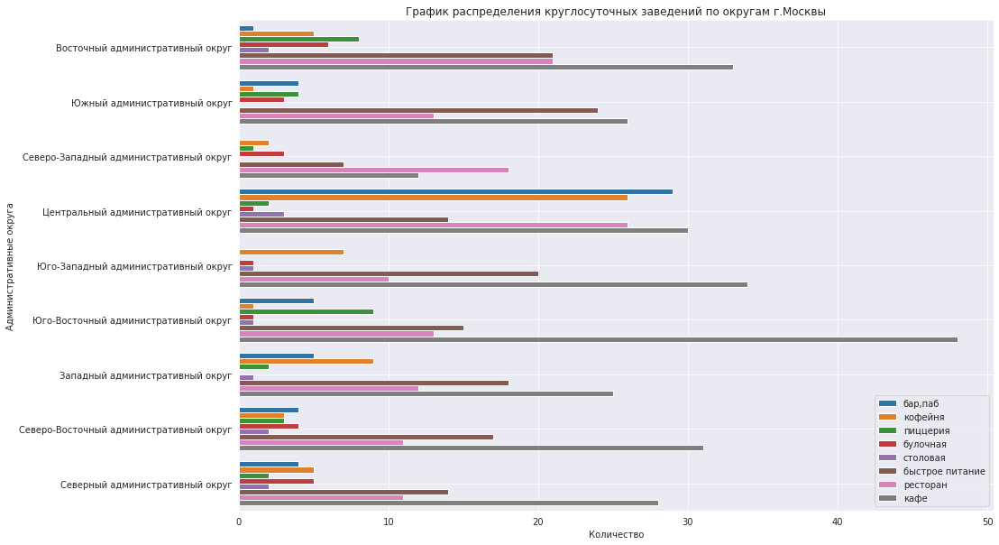

In [49]:
sns.set_style('dark')
# назначаем размер графика
plt.figure(figsize=(15, 10))
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='district', data=round_clock_gr.sort_values('name'), hue='category')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения круглосуточных заведений по округам г.Москвы')
plt.xlabel('Количество')
plt.ylabel('Административные округа')
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=10)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Чаще всего круглосуточными являются кафе. В центральном округе так же много круглосуточных баров пабов.

   Проанализируем как часы работы заведения зависят от их расположения. Посмотрим в каких раойнах больши всего заведений которые работают после полуночи.

In [50]:
# создадим таблицу df_night с колонкой night_tm, в которую отфильтруем все заведения
# которые в часах работы имеют значение '02:00' или '05:00'
df_night = df

df_night['night_tm'] = df_night['hours'].fillna('').str.contains('02:00', '05:00')
df_night = df_night.loc[df_night['night_tm'] == True]
df_night.head(5)


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,night_tm
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False,True
57,мир пиццы,кафе,"Москва, Дмитровское шоссе, 151, корп. 5",Северный административный округ,"ежедневно, 09:00–02:00",55.896323,37.540918,4.2,NaN,NaN,NaN,NaN,0,46.0,Дмитровское шоссе,True,True
67,штаб квартира,"бар,паб","Москва, Дубнинская улица, 32",Северный административный округ,"пн-чт 12:30–00:00; пт,сб 12:30–02:00; вс 12:30–00:00",55.883112,37.558867,5.0,средние,Цена бокала пива:120–350 ₽,NaN,NaN,0,16.0,Дубнинская улица,False,True
83,аль-бухари,кафе,"Москва, улица Пришвина, 3Б",Северо-Восточный административный округ,"ежедневно, 09:00–02:00",55.889872,37.591299,4.3,NaN,NaN,NaN,NaN,0,50.0,улица Пришвина,True,True
97,жигулевское,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00–00:00",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,0,NaN,Бибиревская улица,False,True


In [51]:
df_night_distr = df_night.groupby('district')['name'].count().reset_index()
df_night_distr

,district,name
0,Восточный административный округ,23
1,Западный административный округ,26
2,Северный административный округ,26
3,Северо-Восточный административный округ,28
4,Северо-Западный административный округ,17
5,Центральный административный округ,127
6,Юго-Восточный административный округ,25
7,Юго-Западный административный округ,18
8,Южный административный округ,34


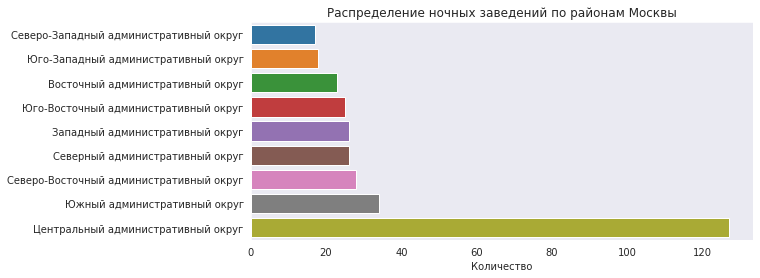

In [52]:
plt.figure(figsize=(9, 4))
ax = sns.barplot(x='name', y='district', data=df_night_distr.sort_values('name'), orient='h')
ax.set_title('Распределение ночных заведений по районам Москвы')
ax.set_xlabel('Количество') 
ax.set_ylabel('') 
plt.show()

В центральном районе очень много заведений работающих после полуночи. В центре жизнь кипит даже ночью.

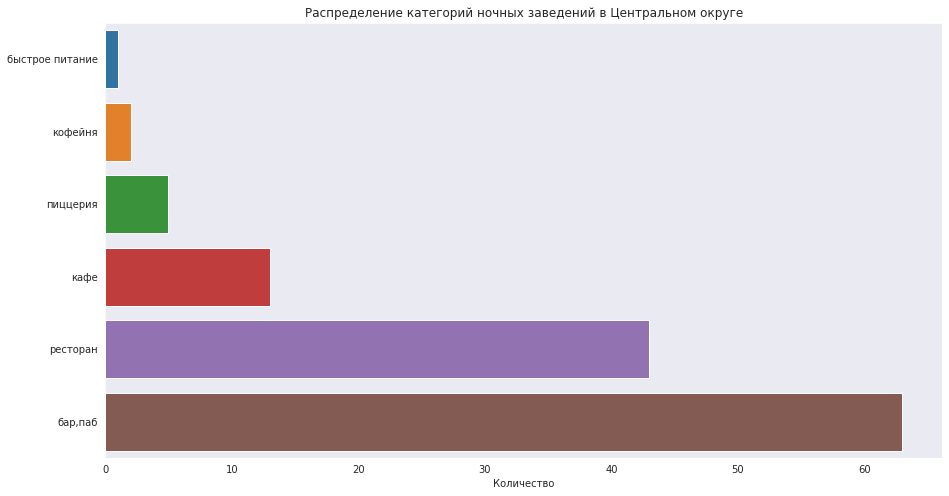

In [53]:
# посмотрим  в каких категория больше всего ночных заведений.
df_night_category = (df_night.query('district == "Центральный административный округ"')
                     .groupby('category')['name'].count().reset_index())

# построим график распределения категорий ночных заведений
plt.figure(figsize=(15, 8))
ax = sns.barplot(x='name', y='category', data=df_night_category.sort_values('name'))
ax.set_title('Распределение категорий ночных заведений в Центральном округе')
ax.set_xlabel('Количество') 
ax.set_ylabel('') 
plt.show()


Ночными заведениями в центре Мосвы чаще всего являются бары, пабы и рестораны.

Выводы:

  *Анализ категории заведений*

В москве очень много заведений общественного питания. Представленны разные категории:
Кафе – 23786
Ресторан - 20434
Кофейня - 14130
бар,паб - 7655
пиццерия - 6332
быстрое питание - 6037
столовая - 3151
булочная – 256
Первая тройка заведений в категории кафе и рестораны и кофейня. Их в москве больше всего. Меньше всего представителей из категории столовая и булочная.

   *Анализ количества посадочных мест*

Больше всего посадочных мест имеют Бары и Рестораны. Это вызвано тем что в заведение быстрого питания, столовую или кафе, посетители обычно заходят быстро перекусить. И за день при небольшом количестве посадочных мест может пройти много людей, тогда как в бары и рестораны приходят чтобы провести там досуг и места занимают на продолжительное время, поэтому если бар хочет хорошую выручку, соответственно нужно больше посадочных мес. А в пиццериях и булочных чаще вообще берут на вынос.

   *Анализ сетевых и не сетевых заведений*

Исследуя заведения в разрез сетей выяснили, что почти 62% всех заведений не сетевые.
Чаще всего сетевыми являются булочные, пиццерии, кофейни. Это заведения рассчитанные на большую проходимость. И количество сетевых среди них больше 50% .Совсем редко сетевые бывают столовые и бары.
     
   Тройка самых популярные сетевых заведения: шоколадница	120; домино'с пицца	76; додо пицца	74.
   
   Тройка популярных категории по сетевым заведнеиям  оказались: кофейня, ресторан, пиццерия.
     
	
 
   *Анализ округов*
    
Почти во всех районах Москвы лидирующими категориями является категории:  «кафе», «Ресторан», «Кофейня». Центральные район отличается от других что здесь самая лидирующая категория «Ресторан», а так же очень популярна «бар,паб»

Исследуя средний рейтинг выяснили что  в разных категориях заведений  он почти не отличается.
Заведения с самым высоким рейтингом находятся в центральном окуге.
Лидирующие улица по количеству заведений :

 1. Проспект Мира.
 
 2. Профсоюзная улица.
 
 3. Проспект Вернадского и Ленинский проспект.
 
В самом низу рейтинга из топ 15 оказалась Пятницкая улица. Но скорее это связано с тем что это очень маленькая улица.

   Это подтверждается нашим исследованием улиц, на которых находится только один объект общепита. Таких улиц больше всего в центральном районе. Это район старой Москвы где есть много маленьких улочек.
    Заведния с самым высоким средним чеком находятся в центральном районе. Самый маленький Средний чек в Юго_западном и Северо-восточном округах. Так же можно заметить особенность что на Окраинах Западного округа и Северо западного округов величина среднего чека остается достаточно высокой. Возможно это связано с тем что данные районы считаются престижными для проживания, и рассчитаны на состоятельных людей.
    В центральном районе очень много заведений работающих после полуночи. Ночными заведениями в центре Москвы чаще всего являются бары, пабы и рестораны.



## Часть. Детализация исследования: открытие кофейни

   В москве очень много заведений общественного питания. Представленны разные категории. Кофейни составляют около 16,8% от всех зведений. Больше всего кофеен расположено в Центральном округе.
  Детализируем наше исследование проведем анализ категории -кофейня
   

In [54]:
df_coffe = df.query('category == "кофейня"')
df_coffe.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,night_tm
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,True,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,True,False
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False,False
52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,True,False


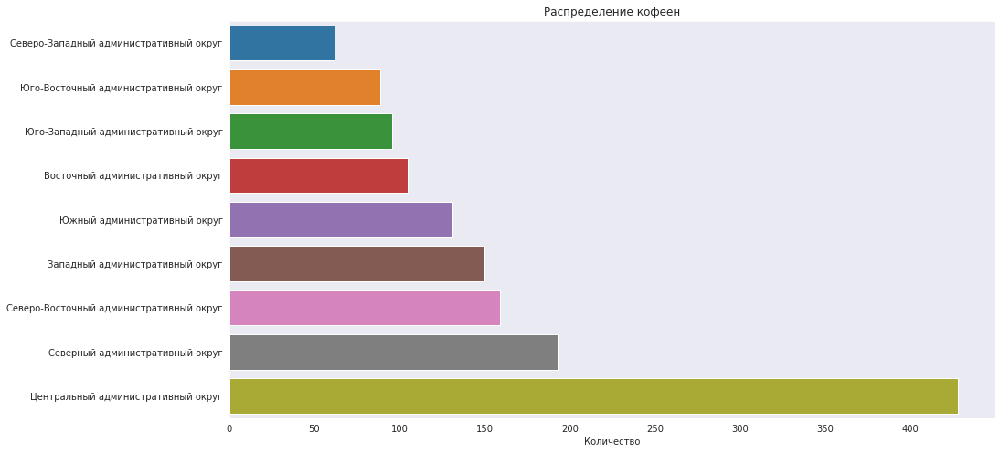

In [55]:
# в каких районах больше всего кофеен
df_coffe_distr = df_coffe.groupby('district')['name'].count().reset_index()

# построим график распределения кофеен
plt.figure(figsize=(15, 8))
ax = sns.barplot(x='name', y='district', data=df_coffe_distr.sort_values('name'))
ax.set_title('Распределение кофеен')
ax.set_xlabel('Количество') 
ax.set_ylabel('') 
plt.show()

Лидером по количеству кофеен является Центральный округ.

In [56]:
# посмотрим как распределены кофейни по карте.
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

df_coffe.apply(create_clusters, axis=1)

m


In [57]:
# выведем названия улиц на которых находится 3 и более кофейни
df_coffe_street = (df_coffe.query('district == "Центральный административный округ"')
                  .groupby("street")['name'].count()
                  .reset_index()
                  .sort_values('name', ascending=False))
df_coffe_street.columns = ['street', 'total']
df_coffe_street.query('total >= 3')

,street,total
166,проспект Мира,17
110,Новослободская улица,13
43,Верхняя Красносельская улица,7
154,Усачёва улица,7
183,улица Земляной Вал,7
148,Тверская улица,6
147,Таганская улица,6
99,Нижний Сусальный переулок,6
65,Комсомольский проспект,6
121,Пресненская набережная,6


In [58]:
# посмотрим наличие круглосуточных кофеен и их распредление по округам.
round_clock_gr.query('category == "кофейня"')

,district,category,name
4,Восточный административный округ,кофейня,5
11,Западный административный округ,кофейня,9
19,Северный административный округ,кофейня,5
27,Северо-Восточный административный округ,кофейня,3
34,Северо-Западный административный округ,кофейня,2
41,Центральный административный округ,кофейня,26
49,Юго-Восточный административный округ,кофейня,1
56,Юго-Западный административный округ,кофейня,7
63,Южный административный округ,кофейня,1


В центральном раоне больше всего круглосуточных кофеен.

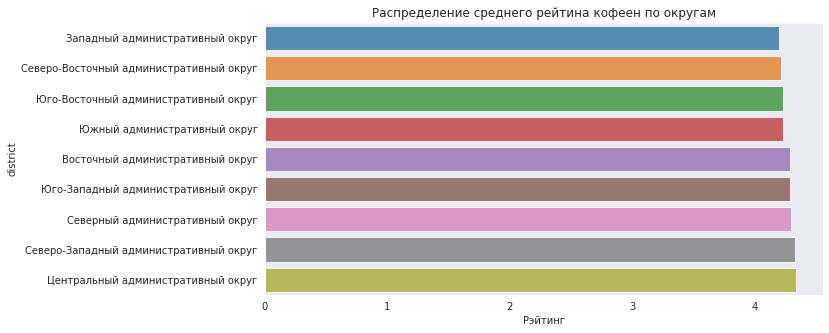

In [59]:
# посмотрим распределение среднего рейтина кофеен по округам.
df_avg_rating=df_coffe.groupby('district')['rating'].mean().reset_index()

plt.figure(figsize=(10, 5))
ax = sns.barplot(x='rating', y='district', data=df_avg_rating.sort_values('rating'), alpha=0.8)
ax.set_title('Распределение среднего рейтина кофеен по округам')
ax.set_xlabel('Рэйтинг')
plt.show()

О среднем рейтинге кофеен можно сказать что он почти не отличается по округам и находится на уровне немного выше 4 баллов.

In [60]:
# посмотрим на распределение средней стоимости чашки кофе по Москве
middle_coffee_cup = df_coffe['middle_coffee_cup'].mean().round()
print('Cредняя стоимость чашки кофе по Москве:', middle_coffee_cup)

Cредняя стоимость чашки кофе по Москве: 175.0


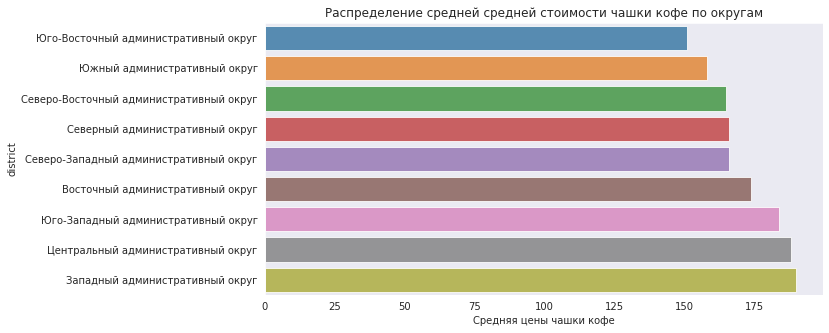

In [61]:
# посмотрим на распределение средней стоимости чашки кофе по округам
df_middle_coffee_cup = df_coffe.groupby('district')['middle_coffee_cup'].mean().round()
df_middle_coffee_cup.reset_index()

plt.figure(figsize=(10, 5))
ax = sns.barplot(x='middle_coffee_cup', y='district', data=df_middle_coffee_cup.reset_index().sort_values('middle_coffee_cup'), alpha=0.8)
ax.set_title('Распределение средней средней стоимости чашки кофе по округам')
ax.set_xlabel('Средняя цены чашки кофе')
plt.show()

Самы дорогой кофе в Центре и на Западе, а так же Юго-западе.

In [62]:
# общие данные по количеству посадочных меcт в Центрально округе.
df_coffe.query('district == "Центральный административный округ"')['seats'].describe()

count    218.000000
mean     113.146789
std      103.207306
min        0.000000
25%       40.000000
50%       86.000000
75%      150.000000
max      500.000000
Name: seats, dtype: float64

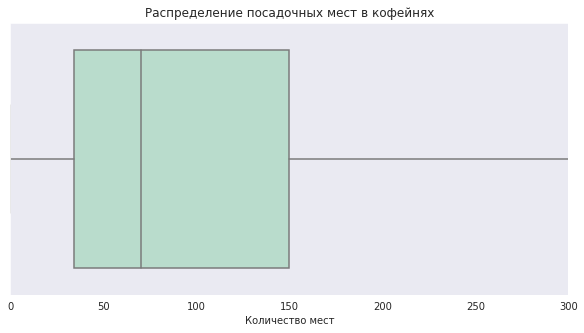

In [63]:
seats_avg = (df_coffe.query('district == "Центральный административный округ"')
             .groupby('name')['seats'].mean().reset_index())

plt.figure(figsize=(10, 5))
plt.title('Распределение посадочных мест в кофейнях')
sns.boxplot(x="seats", data=seats_avg, palette='Pastel2')
plt.xlim(0,300)
plt.xlabel('Количество мест')
plt.show()

В среднем количество посадочных мест от 20 до 150. 50% кофеен имеют 86 посадочных мест. 


# Рекомендации по открытию кофейни.

  * Выбор локации
  
На  графике распределения кофеен видно что больше всего кофеен расположенно в Центральной части Москвы. Это логично ведь Центр - это всегда улицы с высокой проходимостью и большим количество отдыхающих людей и туристов. Но можно подобрать районы или улицы где их скопление минимально.

  * Выбор режима работы.
  
Если выбирать Центральный округ для локации, есть смысл открывать круглосуточную кофейню.
  
  * Определение количества посадочных мест.
  
В выборе количества посадочных мест можно взять диапазон от 90 до 150. В зависимости от возможности помещения.
  
  * Средняя стоимость чашки кофе.
 
Средняя стоимость чашки кофе в кофейне не болжна быть выше, чем у конкурентов. Начать можно с цены в 175 р.
  
  


Презентация: <https://disk.yandex.ru/i/uGwulfeirr_SnA> 